In [1]:
# import the libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader,TensorDataset
from sklearn.model_selection import train_test_split

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg')

C:\Users\shaza\AppData\Local\Temp\ipykernel_24964\2422287361.py:13: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg')


## Import and Explore the Data

In [2]:
# import data
url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/heart-disease/processed.cleveland.data'
data = pd.read_csv(url,sep=',',header=None)
data.columns = ['age','sex','cp','trestbps','chol','fbs','restecg','thalach','exang','oldpeak','slope','ca','thal','DISEASE']

# data contains some '?'s ; replace with NaN and drop these rows
data = data.replace('?',np.nan).dropna()

data

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,DISEASE
0,63.0,1.0,1.0,145.0,233.0,1.0,2.0,150.0,0.0,2.3,3.0,0.0,6.0,0
1,67.0,1.0,4.0,160.0,286.0,0.0,2.0,108.0,1.0,1.5,2.0,3.0,3.0,2
2,67.0,1.0,4.0,120.0,229.0,0.0,2.0,129.0,1.0,2.6,2.0,2.0,7.0,1
3,37.0,1.0,3.0,130.0,250.0,0.0,0.0,187.0,0.0,3.5,3.0,0.0,3.0,0
4,41.0,0.0,2.0,130.0,204.0,0.0,2.0,172.0,0.0,1.4,1.0,0.0,3.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,57.0,0.0,4.0,140.0,241.0,0.0,0.0,123.0,1.0,0.2,2.0,0.0,7.0,1
298,45.0,1.0,1.0,110.0,264.0,0.0,0.0,132.0,0.0,1.2,2.0,0.0,7.0,1
299,68.0,1.0,4.0,144.0,193.0,1.0,0.0,141.0,0.0,3.4,2.0,2.0,7.0,2
300,57.0,1.0,4.0,130.0,131.0,0.0,0.0,115.0,1.0,1.2,2.0,1.0,7.0,3


In [3]:
# describe the data
data.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,DISEASE
count,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000,297.000000
mean,54.542088,0.676768,3.158249,131.693603,247.350168,0.144781,0.996633,149.599327,0.326599,1.055556,1.602694,0.946128
std,9.049736,0.468500,0.964859,17.762806,51.997583,0.352474,0.994914,22.941562,0.469761,1.166123,0.618187,1.234551
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000
25%,48.000000,0.000000,3.000000,120.000000,211.000000,0.000000,0.000000,133.000000,0.000000,0.000000,1.000000,0.000000
50%,56.000000,1.000000,3.000000,130.000000,243.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,0.000000
75%,61.000000,1.000000,4.000000,140.000000,276.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,2.000000
max,77.000000,1.000000,4.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,4.000000


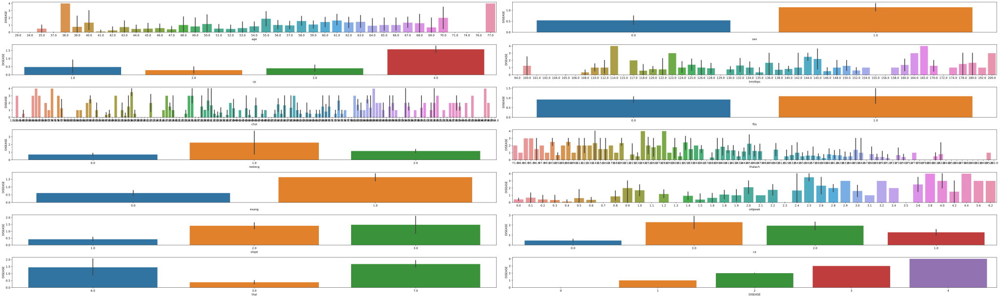

In [4]:
# Create a figure and axis objects for subplots
fig, axs = plt.subplots(7,2, figsize=(50, 15))
axs = axs.flatten()

# Iterate over the features and create scatter subplots
for i, feature in enumerate(data.columns):
    sns.barplot(data=data, x=feature, y='DISEASE', ax=axs[i])
    
plt.tight_layout()

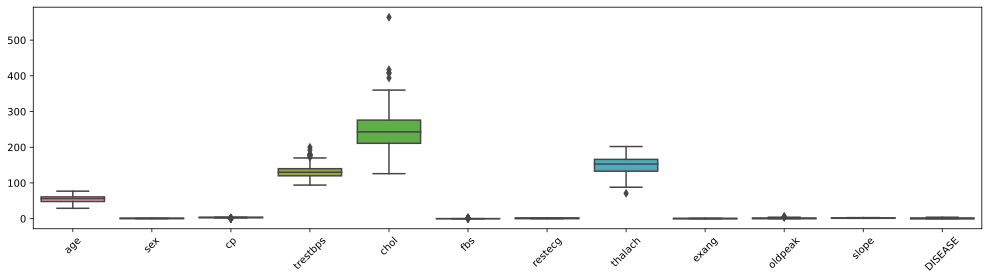

In [5]:
# check the distributions
# check the distributions# check the distributions
fig,ax = plt.subplots(1,figsize=(17,4))
ax = sns.boxplot(data=data)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
plt.show()

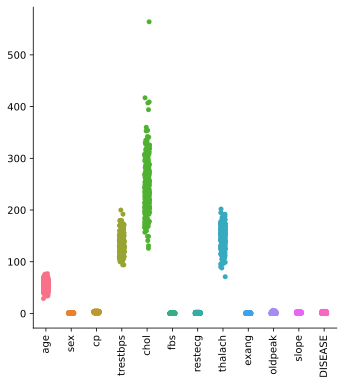

In [6]:
sns.catplot(data=data)
plt.xticks(rotation=90)
plt.show()

In [7]:
sns.pairplot(data=data,hue='DISEASE')
plt.legend()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


C:\Users\shaza\AppData\Local\Temp\ipykernel_24964\2332534149.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, cmap="coolwarm")


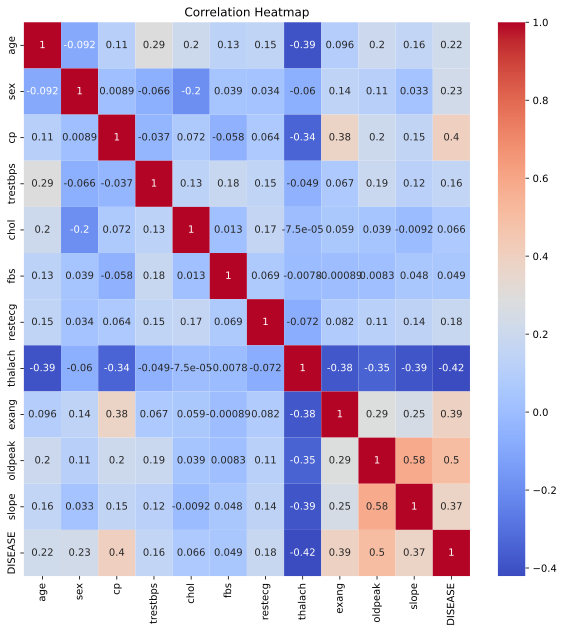

In [8]:
plt.figure(figsize=(10, 10))
sns.heatmap(data.corr(), annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

In [9]:
# z-score the non-categorical columns
cols2zscore = data.keys()
cols2zscore = cols2zscore.drop(['sex','fbs','exang','DISEASE'])

for c in cols2zscore:
    d = pd.to_numeric(data[c])
    data[c] = (d - d.mean())/d.std(ddof=1)

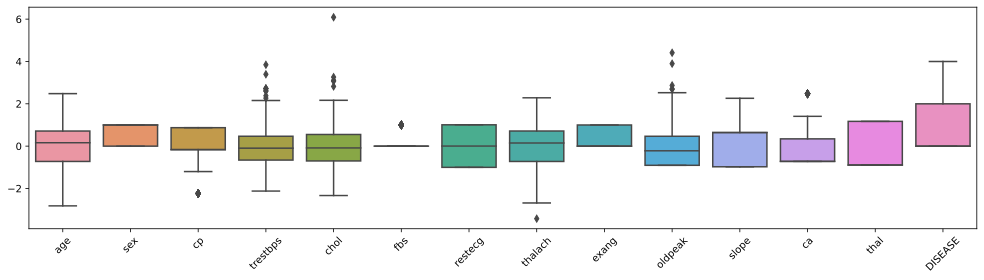

In [10]:
# check the distributions again
fig,ax = plt.subplots(1,figsize=(17,4))
ax = sns.boxplot(data=data)
ax.set_xticklabels(ax.get_xticklabels(),rotation=45)
plt.show()

In [11]:
# count of all unique type of 'DISEASE'
data['DISEASE'].value_counts()

0    160
1     54
2     35
3     35
4     13
Name: DISEASE, dtype: int64

In [12]:
# recode DISEASE to 0 (absent) and 1 (present)
data['DISEASE'][data['DISEASE']>0] = 1

C:\Users\shaza\AppData\Local\Temp\ipykernel_24964\3278262690.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['DISEASE'][data['DISEASE']>0] = 1


# Re-organize the data: train/test in DataLoaders

In [13]:
# convert from pandas dataframe to tensor
dataT = torch.tensor(data[data.keys().drop('DISEASE')].values).float()
labels = torch.tensor(data['DISEASE'].values).float()

print(dataT.shape)
print(labels.shape)

# We insert the labels into a matrix
labels = labels[:,None]
print(labels.shape)

torch.Size([297, 13])
torch.Size([297])
torch.Size([297, 1])


In [14]:
# use scikitlearn to split the data
train_data,test_data,train_label,test_label = train_test_split(dataT,labels,test_size=50)

# then convert them into PyTorch Datasets
train_data = TensorDataset(train_data,train_label)
test_data = TensorDataset(test_data,test_label)

# finally, translate into dataloader objects
batchsize = 20
train_loader = DataLoader(train_data,batch_size=batchsize,shuffle=True,drop_last=True)
test_loader = DataLoader(test_data,batch_size=test_data.tensors[0].shape[0])

In [15]:
# check sizes of data batches
for X,y in train_loader:
    print(X.shape, y.shape)

torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])
torch.Size([20, 13]) torch.Size([20, 1])


# Create a class for the DL Model

In [16]:
class theNet(nn.Module):
    def __init__(self):
        super().__init__()
        
        ## input layer
        self.input = nn.Linear(13,32)
        
        ## hidden layers
        self.fc1 = nn.Linear(32,64)
        self.fc2 = nn.Linear(64,10)
        
        ## output layer
        self.output = nn.Linear(10,1)
    
    def forward(self,x):
        x = F.relu(self.input(x))
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.output(x)

In [17]:
# test the model on a bit of data
net = theNet()

X,y = next(iter(train_loader))
yHat = net(X)
print(yHat)

# test the loss function
lossfun = nn.BCEWithLogitsLoss()
lossfun(yHat,y)

tensor([[-0.1875],
        [-0.1634],
        [-0.1872],
        [-0.1717],
        [-0.1675],
        [-0.1548],
        [-0.1666],
        [-0.2086],
        [-0.1869],
        [-0.1547],
        [-0.1559],
        [-0.1727],
        [-0.1905],
        [-0.1573],
        [-0.1918],
        [-0.1563],
        [-0.1921],
        [-0.1818],
        [-0.1469],
        [-0.1547]], grad_fn=<AddmmBackward0>)


tensor(0.6649, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)

# Train the Model and Show Performance

In [18]:
# start with a fresh network
net = theNet()
optimizer = torch.optim.Adam(net.parameters(),lr=.0001)
lossfun = nn.BCEWithLogitsLoss()

numepochs = 200

trainLoss = torch.zeros(numepochs)
testLoss = torch.zeros(numepochs)
trainAcc = torch.zeros(numepochs)
testAcc = torch.zeros(numepochs)

# loop over epochs
for epochi in range(numepochs):
    
    # loop over training data bacthes
    batchLoss = []
    for X,y in train_loader:
        
        # forward pass and loss
        yHat = net(X)
        loss = lossfun(yHat,y)
        
        # backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # loss from the batch
        batchLoss.append(loss.item())
        
        # train accuracy
        predictions = (torch.sigmoid(yHat)>.5).float()
        trainAcc[epochi] = 100*torch.mean((predictions==y).float())
        
    # end of batch loop...
    
    # get average losses across the batches
    trainLoss[epochi] = np.mean(batchLoss)
    
    # the test
    X,y = next(iter(test_loader))
    yHat = net(X)
    
    # test loss
    loss = lossfun(yHat,y)
    testLoss[epochi] = loss.item()
    
    # test accuracy
    predictions = (torch.sigmoid(yHat)>.5).float()
    testAcc[epochi] = 100*torch.mean((predictions==y).float())
         

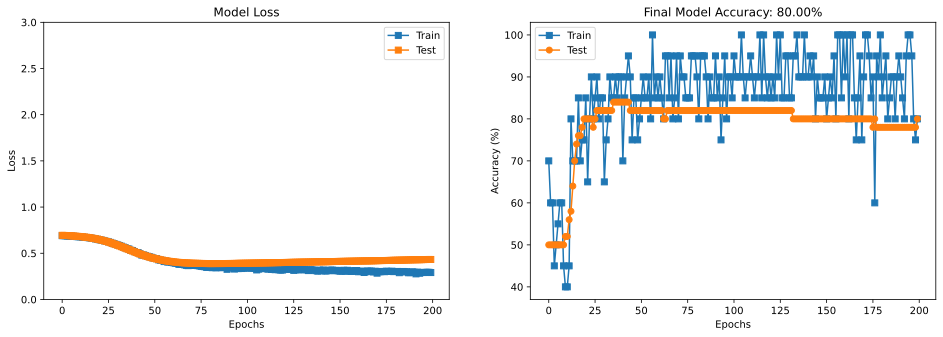

In [19]:
fig,ax = plt.subplots(1,2,figsize=(16,5))

ax[0].plot(trainLoss,'s-',label='Train')
ax[0].plot(testLoss,'s-',label='Test')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_ylim([0,3])
ax[0].set_title('Model Loss')
ax[0].legend()

ax[1].plot(trainAcc,'s-',label='Train')
ax[1].plot(testAcc,'o-',label='Test')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title(f'Final Model Accuracy: {testAcc[-1]:.2f}%')
ax[1].legend()

plt.show()

# Hyperparameter Testing

# Testing the number of layers and units 

( We will go with BCEWithLogitsLoss function as Loss function
And, Adam optimizer as optimizer in every test)


Finished units 1/6 and layers 1/5
Finished units 2/6 and layers 1/5
Finished units 3/6 and layers 1/5
Finished units 4/6 and layers 1/5
Finished units 5/6 and layers 1/5
Finished units 6/6 and layers 1/5
Finished units 1/6 and layers 2/5
Finished units 2/6 and layers 2/5
Finished units 3/6 and layers 2/5
Finished units 4/6 and layers 2/5
Finished units 5/6 and layers 2/5
Finished units 6/6 and layers 2/5
Finished units 1/6 and layers 3/5
Finished units 2/6 and layers 3/5
Finished units 3/6 and layers 3/5
Finished units 4/6 and layers 3/5
Finished units 5/6 and layers 3/5
Finished units 6/6 and layers 3/5
Finished units 1/6 and layers 4/5
Finished units 2/6 and layers 4/5
Finished units 3/6 and layers 4/5
Finished units 4/6 and layers 4/5
Finished units 5/6 and layers 4/5
Finished units 6/6 and layers 4/5
Finished units 1/6 and layers 5/5
Finished units 2/6 and layers 5/5
Finished units 3/6 and layers 5/5
Finished units 4/6 and layers 5/5
Finished units 5/6 and layers 5/5
Finished units

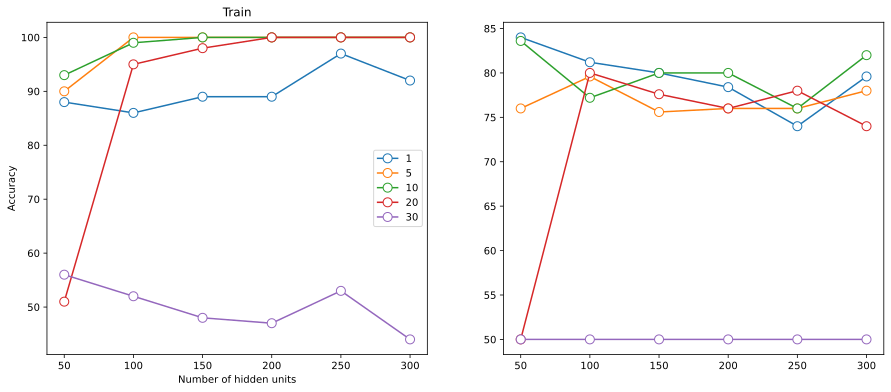

In [24]:
# Creating a class to test the layers and units
# We keep learning rate at .0001

def createTheHeartNet(nUnits,nLayers):
    
    class HeartNet(nn.Module):
        def __init__(self,nUnits,nLayers):
            super().__init__()
            
            self.layers = nn.ModuleDict()
            self.nLayers = nLayers
            
            self.layers['input'] = nn.Linear(13,nUnits)
            
            for i in range(nLayers):
                self.layers[f'hidden {i}']= nn.Linear(nUnits,nUnits)
                
            self.layers['output'] = nn.Linear(nUnits,1)
            
        def forward(self,x):
            
            x = self.layers['input'](x)
            
            for i in range(self.nLayers):
                x = F.relu(self.layers[f'hidden {i}'](x))
                
            x = self.layers['output'](x)
            return x
            
    net = HeartNet(nUnits,nLayers)
        
    lossfun = nn.BCEWithLogitsLoss()
        
    optimizer = torch.optim.Adam(net.parameters(),lr=.0001)
        
    return net,lossfun,optimizer

def function2TrainTheModel(nUnits,nLayers):
    
    numepochs = 100
    
    net,lossfun,optimizer = createTheHeartNet(nUnits,nLayers)
    
    trainLoss = []
    testLoss = []
    trainAcc = []
    testAcc = []

    for epochi in range(numepochs):

        batchLoss = []
        for X,y in train_loader:

            yHat = net(X)
            loss = lossfun(yHat,y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())

            predictions = (torch.sigmoid(yHat)>.5).float()
            trainAcc.append(100*torch.mean((predictions==y).float()))

        trainLoss.append(np.mean(batchLoss))

        X,y = next(iter(test_loader))
        yHat = net(X)

        loss = lossfun(yHat,y)
        testLoss.append(loss.item())

        predictions = (torch.sigmoid(yHat)>.5).float()
        testAcc.append(100*torch.mean((predictions==y).float()))

    return trainAcc,testAcc,testLoss,net

numlayers = [1,5,10,20,30]
numunits = np.arange(50,301,50)

accuracies = np.zeros((2,len(numunits),len(numlayers)))

for layeridx in range(len(numlayers)):
    for unitidx in range(len(numunits)):
     
        trainAcc,testAcc,losses,net = function2TrainTheModel(numunits[unitidx],numlayers[layeridx])
        accuracies[0,unitidx,layeridx] = np.mean(trainAcc[-5:])
        accuracies[1,unitidx,layeridx] = np.mean(testAcc[-5:])
        
        print(f'Finished units {unitidx+1}/{len(numunits)} and layers {layeridx+1}/{len(numlayers)}')

fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].plot(numunits,accuracies[0,:,:],'o-',markerfacecolor='w',markersize=9)
ax[1].plot(numunits,accuracies[1,:,:],'o-',markerfacecolor='w',markersize=9)

for i in range(2):
    ax[i].legend(numlayers)
    ax[i].set_ylabel('Accuracy')
    ax[i].set_xlabel('Number of hidden units')
    ax[i].set_title(['Train' if i==0 else 'Test'][0])
    
    plt.show()


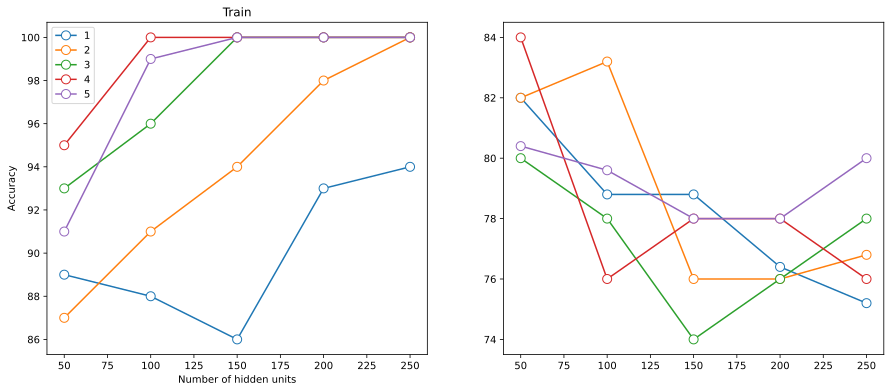

In [23]:
# We performed the same experiemnt again, but with hidden layers with an increment of 1-5

fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].plot(numunits,accuracies[0,:,:],'o-',markerfacecolor='w',markersize=9)
ax[1].plot(numunits,accuracies[1,:,:],'o-',markerfacecolor='w',markersize=9)

for i in range(2):
    ax[i].legend(numlayers)
    ax[i].set_ylabel('Accuracy')
    ax[i].set_xlabel('Number of hidden units')
    ax[i].set_title(['Train' if i==0 else 'Test'][0])
    
    plt.show()

Finished units 1/7 and layers 1/5
Finished units 2/7 and layers 1/5
Finished units 3/7 and layers 1/5
Finished units 4/7 and layers 1/5
Finished units 5/7 and layers 1/5
Finished units 6/7 and layers 1/5
Finished units 7/7 and layers 1/5
Finished units 1/7 and layers 2/5
Finished units 2/7 and layers 2/5
Finished units 3/7 and layers 2/5
Finished units 4/7 and layers 2/5
Finished units 5/7 and layers 2/5
Finished units 6/7 and layers 2/5
Finished units 7/7 and layers 2/5
Finished units 1/7 and layers 3/5
Finished units 2/7 and layers 3/5
Finished units 3/7 and layers 3/5
Finished units 4/7 and layers 3/5
Finished units 5/7 and layers 3/5
Finished units 6/7 and layers 3/5
Finished units 7/7 and layers 3/5
Finished units 1/7 and layers 4/5
Finished units 2/7 and layers 4/5
Finished units 3/7 and layers 4/5
Finished units 4/7 and layers 4/5
Finished units 5/7 and layers 4/5
Finished units 6/7 and layers 4/5
Finished units 7/7 and layers 4/5
Finished units 1/7 and layers 5/5
Finished units

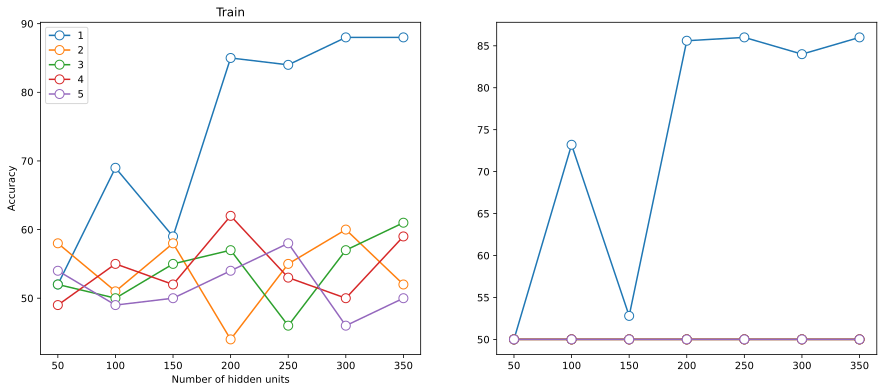

In [25]:
# Based on the above two experiments, we can see that having more than 1 layer is overfitting on the training data (i.e., we 
# are obtaining a training accuracy ~ 100% and test accuracy ~80%)
# The model with 1 layer is performing equally well on the training as well as test set. 
# more layers (~30) are horrible 

# In order to resolve this issuse, we can add some regularization to the model to preven overfitting and see whether that improves 
# our performance on different layers. We will be testing 

def createTheHeartNet(nUnits,nLayers):
    
    class HeartNet(nn.Module):
        def __init__(self,nUnits,nLayers):
            super().__init__()
            
            self.layers = nn.ModuleDict()
            self.nLayers = nLayers
            
            self.layers['input'] = nn.Linear(13,nUnits)
            
            for i in range(nLayers):
                self.layers[f'hidden {i}']= nn.Linear(nUnits,nUnits)
                
            self.layers['output'] = nn.Linear(nUnits,1)
            
        def forward(self,x):
            
            x = self.layers['input'](x)
            
            for i in range(self.nLayers):
                x = F.relu(self.layers[f'hidden {i}'](x))
                
            x = self.layers['output'](x)
            return x
            
    net = HeartNet(nUnits,nLayers)
        
    lossfun = nn.BCEWithLogitsLoss()
        
    optimizer = torch.optim.Adam(net.parameters(),lr=.0001, weight_decay=0.5)
        
    return net,lossfun,optimizer

def function2TrainTheModel(nUnits,nLayers):
    
    numepochs = 100
    
    net,lossfun,optimizer = createTheHeartNet(nUnits,nLayers)
    
    trainLoss = []
    testLoss = []
    trainAcc = []
    testAcc = []

    for epochi in range(numepochs):

        batchLoss = []
        for X,y in train_loader:

            yHat = net(X)
            loss = lossfun(yHat,y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())

            predictions = (torch.sigmoid(yHat)>.5).float()
            trainAcc.append(100*torch.mean((predictions==y).float()))

        trainLoss.append(np.mean(batchLoss))

        X,y = next(iter(test_loader))
        yHat = net(X)

        loss = lossfun(yHat,y)
        testLoss.append(loss.item())

        predictions = (torch.sigmoid(yHat)>.5).float()
        testAcc.append(100*torch.mean((predictions==y).float()))

    return trainAcc,testAcc,testLoss,net

numlayers = [1,2,3,4,5]
numunits = np.arange(50,351,50)

accuracies = np.zeros((2,len(numunits),len(numlayers)))

for layeridx in range(len(numlayers)):
    for unitidx in range(len(numunits)):
     
        trainAcc,testAcc,losses,net = function2TrainTheModel(numunits[unitidx],numlayers[layeridx])
        accuracies[0,unitidx,layeridx] = np.mean(trainAcc[-5:])
        accuracies[1,unitidx,layeridx] = np.mean(testAcc[-5:])
        
        print(f'Finished units {unitidx+1}/{len(numunits)} and layers {layeridx+1}/{len(numlayers)}')

fig,ax = plt.subplots(1,2,figsize=(15,6))
ax[0].plot(numunits,accuracies[0,:,:],'o-',markerfacecolor='w',markersize=9)
ax[1].plot(numunits,accuracies[1,:,:],'o-',markerfacecolor='w',markersize=9)

for i in range(2):
    ax[i].legend(numlayers)
    ax[i].set_ylabel('Accuracy')
    ax[i].set_xlabel('Number of hidden units')
    ax[i].set_title(['Train' if i==0 else 'Test'][0])
    
    plt.show()

In [26]:
# So finally after applying regularization, we have confirmed that 1 layer with >300 units is the ideal ANN 
# architecture to go with 

# Testing the value of Regularizations

In [30]:
# We check the value of L2 regularizations and see which value gives us the best fit

# We go with 1 layer and 400 unit architecture

def createTheHeartNet(l2lambda):
    
    class HeartNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.input = nn.Linear(13,400)
            
            self.fc1 = nn.Linear(400,400)
            
            self.output = nn.Linear(400,1)
        
        def forward(self,x):
            x = F.relu(self.input(x))
            x = F.relu(self.fc1(x))
            return self.output(x)
        
    net = HeartNet()
    
    lossfun = nn.BCEWithLogitsLoss()
    
    optimizer = torch.optim.Adam(net.parameters(),lr=.001, weight_decay=l2lambda)
    
    return net,lossfun,optimizer
            

def function2TrainTheModel(l2lambda):
    
    numepochs = 100
    
    net,lossfun,optimizer = createTheHeartNet(l2lambda)
    
    trainLoss = []
    testLoss = []
    trainAcc = []
    testAcc = []

    for epochi in range(numepochs):

        batchLoss = []
        for X,y in train_loader:

            yHat = net(X)
            loss = lossfun(yHat,y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())

            predictions = (torch.sigmoid(yHat)>.5).float()
            trainAcc.append(100*torch.mean((predictions==y).float()))

        trainLoss.append(np.mean(batchLoss))

        X,y = next(iter(test_loader))
        yHat = net(X)

        loss = lossfun(yHat,y)
        testLoss.append(loss.item())

        predictions = (torch.sigmoid(yHat)>.5).float()
        testAcc.append(100*torch.mean((predictions==y).float()))

    return trainAcc,testAcc,testLoss,net

def smooth(x,k=5):
    return np.convolve(x,np.ones(k)/k,mode='same')

# We check for 6 l2 lambda in the range 0-0.1

l2lambdas = np.linspace(0,.1,6)

accuracyResultsTrain = np.zeros((numepochs,len(l2lambdas)))
accuracyResultsTest = np.zeros((numepochs,len(l2lambdas)))

for li in range(len(l2lambdas)):
    
    trainAcc,testAcc,losses,net = function2TrainTheModel(l2lambdas[li])
    
    accuracyResultsTrain[:,li] = trainAcc
    accuracyResultsTest[:,li] = testAcc
    
fig,ax = plt.subplots(1,2,figsize=(15,5))

ax[0].plot(accuracyResultsTrain,linewidth=2)
ax[0].set_title('Train accuracy')
ax[1].plot(accuracyResultsTest,linewidth=2)
ax[1].set_title('Test accuracy')

leglabels = [np.round(i,2) for i in l2lambdas]

for i in range(2):
    ax[i].legend(leglabels)
    ax[i].set_xlabel('Epoch')
    ax[i].set_ylabel('Accuracy (%)')
    ax[i].set_ylim([30,101])
    ax[i].grid()

plt.tight_layout()
plt.show()

ValueError: could not broadcast input array from shape (1200,) into shape (200,)

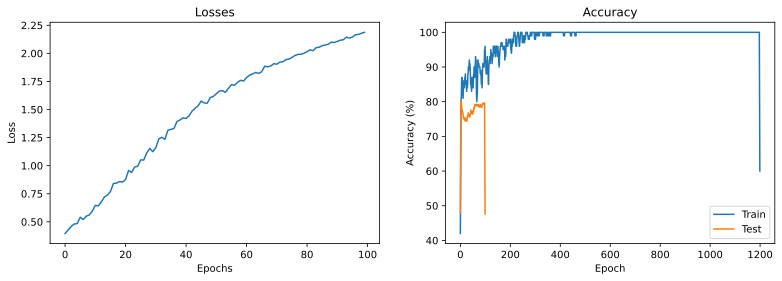

In [38]:
def createTheHeartNet():
    
    class HeartNet(nn.Module):
        def __init__(self):
            super().__init__()
            
            self.input = nn.Linear(13,400)
            
            self.fc1 = nn.Linear(400,400)
            
            self.output = nn.Linear(400,1)
        
        def forward(self,x):
            x = self.input(x)
            x = F.relu(self.fc1(x))
            return self.output(x)
        
    net = HeartNet()
    
    lossfun = nn.BCEWithLogitsLoss()
    
    optimizer = torch.optim.Adam(net.parameters(),lr=.001)
    
    return net,lossfun,optimizer
            

def function2TrainTheModel():
    
    numepochs = 100
    
    net,lossfun,optimizer = createTheHeartNet()
    
    trainLoss = []
    testLoss = []
    trainAcc = []
    testAcc = []

    for epochi in range(numepochs):

        batchLoss = []
        for X,y in train_loader:

            yHat = net(X)
            loss = lossfun(yHat,y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            batchLoss.append(loss.item())

            predictions = (torch.sigmoid(yHat)>.5).float()
            trainAcc.append(100*torch.mean((predictions==y).float()))

        trainLoss.append(np.mean(batchLoss))

        X,y = next(iter(test_loader))
        yHat = net(X)

        loss = lossfun(yHat,y)
        testLoss.append(loss.item())

        predictions = (torch.sigmoid(yHat)>.5).float()
        testAcc.append(100*torch.mean((predictions==y).float()))

    return trainAcc,testAcc,testLoss,net

trainAcc,testAcc,testLoss, net = function2TrainTheModel()

fig,ax = plt.subplots(1,2,figsize=(13,4))

ax[0].plot(testLoss)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Loss')
ax[0].set_title('Losses')

ax[1].plot(smooth(trainAcc),label='Train')
ax[1].plot(smooth(testAcc),label='Test')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Accuracy (%)')
ax[1].set_title('Accuracy')
ax[1].legend()

plt.show()